<div style="font-size:37px; font-weight:bold; line-height:1.1">
    Using pyllshading
</div>

<p style="color:rgb(90,90,90);">
The MIT License (MIT)
</p>
<p style="color:rgb(90,90,90);">
Copyright (c) 2020 Guillaume Rongier
</p>
<p style="color:rgb(90,90,90);">
Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:
</p>
<ul style="color:rgb(90,90,90);">
<li>The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.</li>
<li>THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.</li>
</ul>

This notebook shows how to use the functionalities of pyllshading for geomorphometry and hillshading using Upper Normandy as an example.

On top of pyllshading, this notebook requires NumPy, SciPy, matplotlib, utm, rasterio, and Scikit Data Access.

# Package imports

In [1]:
from getpass import getpass
import numpy as np
import scipy.ndimage as ndi
import matplotlib.pyplot as plt
from matplotlib import cm, colors, colorbar

import utm
import rasterio as rio
import rasterio.warp as rwarp

from skdaccess.geo.srtm.cache import DataFetcher as SRTM_DF
from skdaccess.utilities.srtm_util import merge_srtm_tiles

import pyllshading as psd

# Download the SRTM topography

This section shows how to download a SRTM topography using [Scikit Data Access](https://github.com/MITHaystack/scikit-dataaccess). First, enter the username and password for your [Earthdata](https://earthdata.nasa.gov/) account, to recover the data from NASA repositories.

In [2]:
username = 'username'
password = getpass(prompt='Password: ')

Password: ········


We can then define the extent of the SRTM tiles to download.

In [3]:
lat_min = 49
lat_max = 50
lon_min = 0
lon_max = 2

And download and merge the tiles.

In [4]:
srtm_df = SRTM_DF(lat_tile_start=lat_min,
                  lat_tile_end=lat_max - 1,
                  lon_tile_start=lon_min,
                  lon_tile_end=lon_max - 1,
                  username=username,
                  password=password,
                  mask_water=False)
srtm_tiles = srtm_df.output()
srtm_elevation, srtm_extent = merge_srtm_tiles(srtm_tiles,
                                               lon_min,
                                               lon_max,
                                               lat_min,
                                               lat_max)

100%|██████████| 2/2 [00:54<00:00, 27.04s/it]


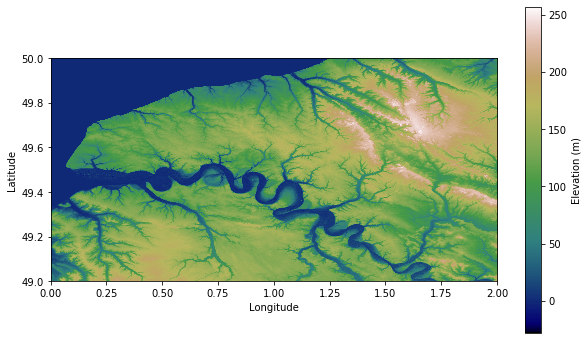

In [5]:
figure = plt.figure(figsize=(10, 6))

plt.imshow(srtm_elevation, cmap=cm.gist_earth, extent=srtm_extent)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Elevation (m)')

plt.show()

We won't use the full raster in the following steps, but a smaller area centered on the Seine river.

In [6]:
new_bounds = (0.25, 49.1, 1.50, 49.65)

# Project the topography

This section show how to project the topography using [rasterio](https://rasterio.readthedocs.io/en/latest/). First, define the projection and transform of the downloaded SRTM topography.

In [7]:
src_crs = rio.crs.CRS.from_epsg(4326)
src_transform = rio.transform.from_bounds(lon_min,
                                          lat_min,
                                          lon_max,
                                          lat_max,
                                          srtm_elevation.shape[1],
                                          srtm_elevation.shape[0])

And get the UTM projection for the projected map.

In [8]:
utm_zones = []
for lat in range(lat_min, lat_max):
    for lon in range(lon_min, lon_max):
        utm_coordinate = utm.from_latlon(lat, lon)
        utm_zones.append(utm_coordinate[2])
most_frequent_utm_zone = max(set(utm_zones), key=utm_zones.count)
print('Selected UTM zone:', most_frequent_utm_zone)

dst_crs = rio.crs.CRS(init='epsg:326' + str(most_frequent_utm_zone))

Selected UTM zone: 31


We can then define the transform for the projected map.

In [9]:
dst_resolution = 30

dst_bounds = rwarp.transform_bounds(src_crs, dst_crs, *new_bounds)
dst_width = int((dst_bounds[2] - dst_bounds[0])/dst_resolution)
dst_height = int((dst_bounds[3] - dst_bounds[1])/dst_resolution)
dst_transform = (dst_resolution, 0., dst_bounds[0], 0., -dst_resolution, dst_bounds[3])

And project the map in UTM coordinates.

In [10]:
elevation = np.empty((dst_height, dst_width))
_ = rwarp.reproject(srtm_elevation,
                    destination=elevation,
                    src_transform=src_transform,
                    src_crs=src_crs,
                    dst_transform=dst_transform,
                    dst_crs=dst_crs,
                    dst_nodata=np.nan,
                    resampling=rwarp.Resampling.cubic)

Let's get the projected extent for plotting.

In [11]:
extent = np.array((dst_transform[2],
                   dst_transform[2] + dst_width*dst_transform[0],
                   dst_transform[5] + dst_height*dst_transform[4],
                   dst_transform[5]))

We now have the elevation data to use as an example.

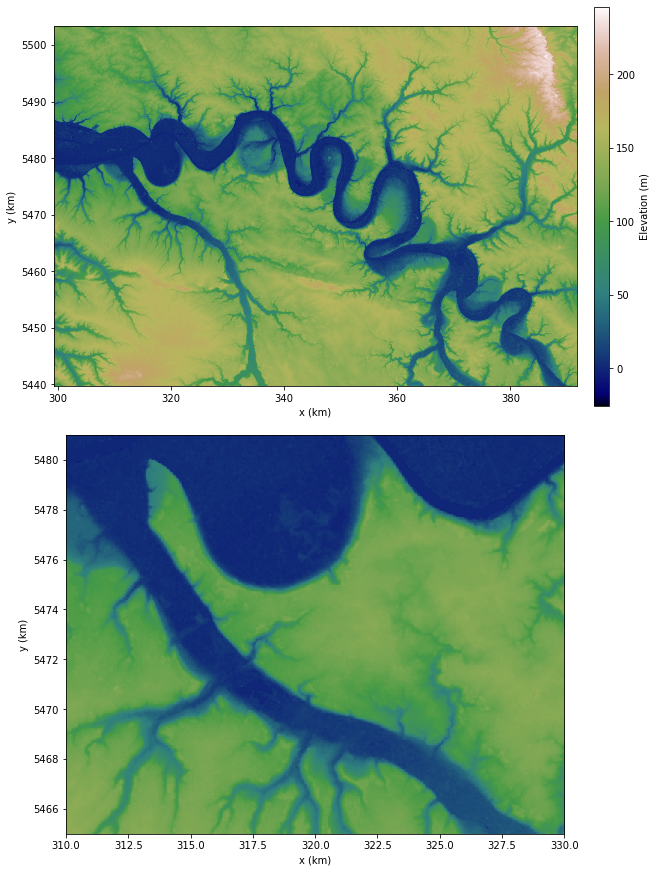

In [12]:
figure, subplots = plt.subplots(nrows=2, figsize=(9, 12), constrained_layout=True)

image = subplots[0].imshow(elevation, cmap=cm.gist_earth, extent=extent/1000.)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')
plt.colorbar(image, ax=subplots[0], label='Elevation (m)')

subplots[1].imshow(elevation, cmap=cm.gist_earth, extent=extent/1000.)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()

# Resampling

This section show how to resample a raster to a lower resolution...

In [13]:
generalized_elevation, generalized_transform = psd.utils.resample(elevation,
                                                                  dst_transform,
                                                                  dst_crs,
                                                                  1000)

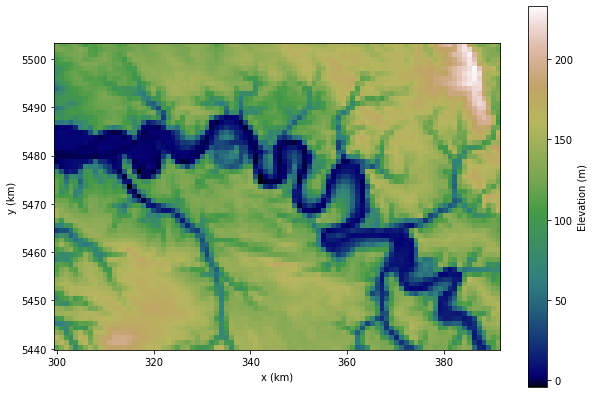

In [14]:
figure = plt.figure(figsize=(10, 7))

plt.imshow(generalized_elevation, cmap=cm.gist_earth, extent=extent/1000.)
plt.colorbar(label='Elevation (m)')
plt.xlabel('x (km)')
plt.ylabel('y (km)')

plt.show()

... and resample it back to its original resolution.

In [15]:
back_elevation, back_transform = psd.utils.resample(generalized_elevation,
                                                    generalized_transform,
                                                    dst_crs,
                                                    dst_resolution)

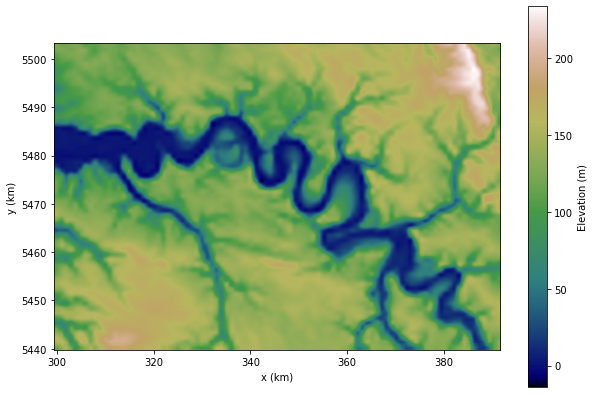

In [16]:
figure = plt.figure(figsize=(10, 7))

plt.imshow(back_elevation, cmap=cm.gist_earth, extent=extent/1000.)
plt.colorbar(label='Elevation (m)')
plt.xlabel('x (km)')
plt.ylabel('y (km)')

plt.show()

This technique can be used to generalize a raster, i.e., to eliminate the unnecessary details and make the hillshaded map clearer.

# Geomorphometry

This section shows some properties to compute on a raster for hillshading or for classifying landforms for instance.

Let's start with [Horn's slope and aspect](https://doi.org/10.1109/PROC.1981.11918), measuring respectively the steepness and the direction the slope faces.

In [17]:
slope = psd.geomorphometry.compute_horn_slope(elevation, dst_resolution)
aspect = psd.geomorphometry.compute_horn_aspect(elevation, dst_resolution)

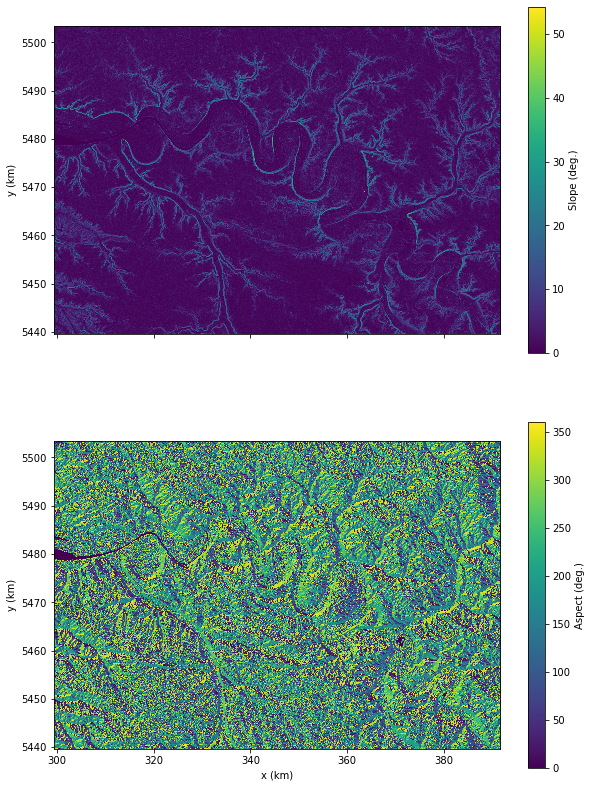

In [18]:
figure, subplots = plt.subplots(nrows=2, sharex=True, figsize=(10, 14))

image = subplots[0].imshow(np.rad2deg(slope), extent=extent/1000.)
plt.colorbar(image, ax=subplots[0], label='Slope (deg.)')
subplots[0].set_ylabel('y (km)')

image = subplots[1].imshow(np.rad2deg(aspect), extent=extent/1000.)
plt.colorbar(image, ax=subplots[1], label='Aspect (deg.)')
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')

plt.show()

Now let's compute some curvatures, used in particular to identify valleys and ridges.

In [19]:
smoothed_elevation = ndi.gaussian_filter(elevation, 4)
plan_curvature = psd.geomorphometry.compute_plan_curvature(smoothed_elevation,
                                                           spacing=dst_resolution)
max_curvature = psd.geomorphometry.compute_positive_max_curvature(smoothed_elevation,
                                                                  spacing=dst_resolution)
min_curvature = psd.geomorphometry.compute_negative_min_curvature(smoothed_elevation,
                                                                  spacing=dst_resolution)

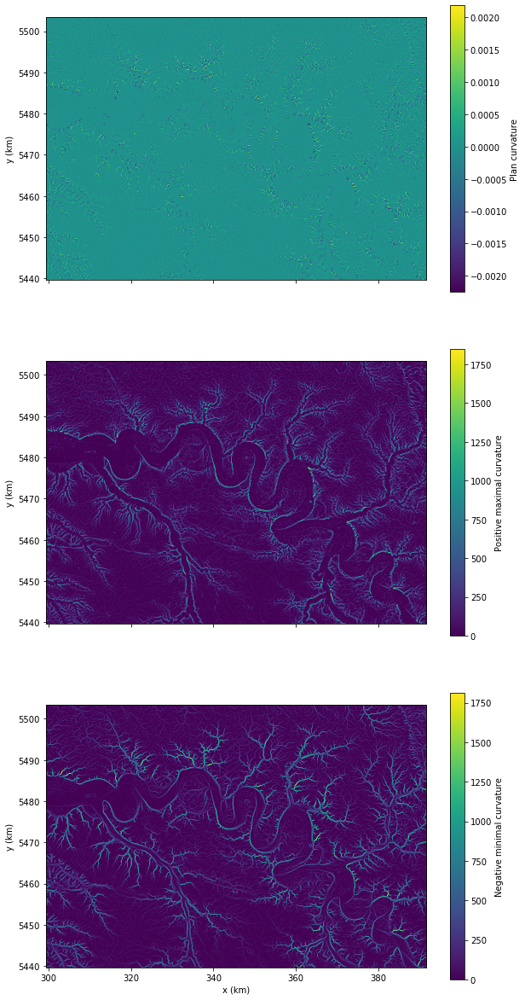

In [20]:
figure, subplots = plt.subplots(nrows=3, sharex=True, figsize=(10, 21))

image = subplots[0].imshow(plan_curvature, extent=extent/1000.)
plt.colorbar(image, ax=subplots[0], label='Plan curvature')
subplots[0].set_ylabel('y (km)')

image = subplots[1].imshow(max_curvature, extent=extent/1000.)
plt.colorbar(image, ax=subplots[1], label='Positive maximal curvature')
subplots[1].set_ylabel('y (km)')

image = subplots[2].imshow(min_curvature, extent=extent/1000.)
plt.colorbar(image, ax=subplots[2], label='Negative minimal curvature')
subplots[2].set_xlabel('x (km)')
subplots[2].set_ylabel('y (km)')

plt.show()

We can also compute [Wood's terrain parameters](https://leicester.figshare.com/articles/The_geomorphological_characterisation_of_Digital_Elevation_Models_/10152368) for the parameterization of geomorphological surfaces, which allows us to eliminate all the small terrain details and keep only the global picture by setting a large window size.

In [21]:
wood_parameters = psd.geomorphometry.compute_wood_terrain_parameters(elevation,
                                                                     window_size=31,
                                                                     spacing=dst_resolution,
                                                                     p=2,
                                                                     constrained=False,
                                                                     mode='reflect')

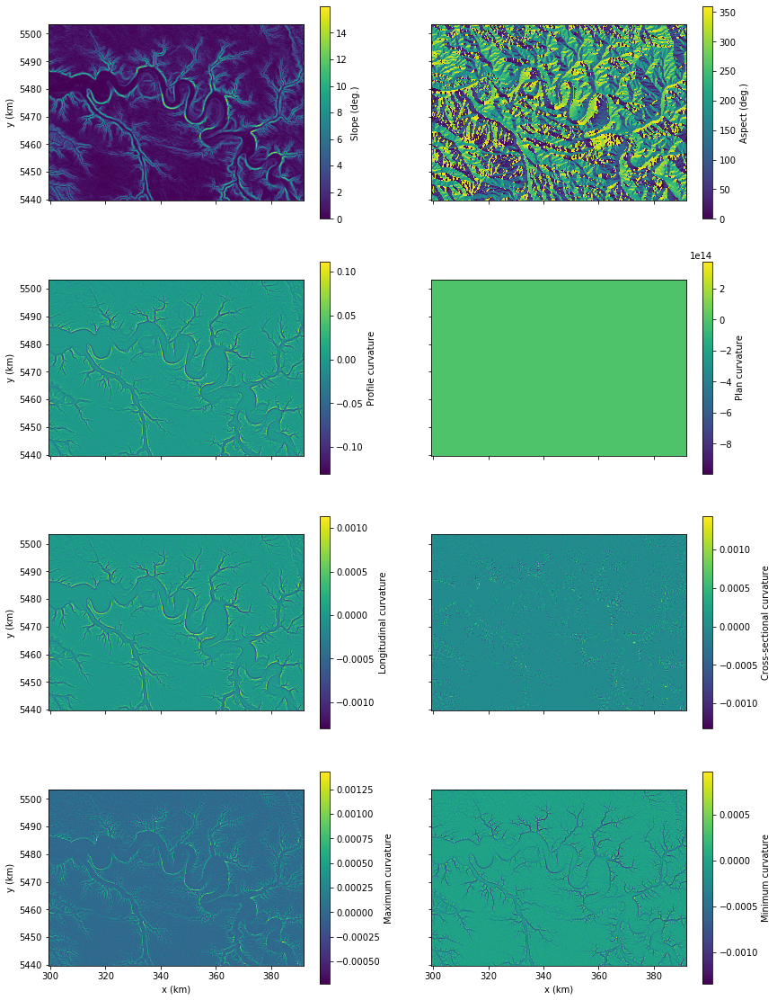

In [22]:
figure, subplots = plt.subplots(nrows=4, ncols=2, sharex=True, sharey=True, figsize=(14, 20))

image = subplots[0, 0].imshow(np.rad2deg(wood_parameters[0]), extent=extent/1000.)
plt.colorbar(image, ax=subplots[0, 0], label='Slope (deg.)')
subplots[0, 0].set_ylabel('y (km)')

image = subplots[0, 1].imshow(np.rad2deg(wood_parameters[1]), extent=extent/1000.)
plt.colorbar(image, ax=subplots[0, 1], label='Aspect (deg.)')

image = subplots[1, 0].imshow(wood_parameters[2], extent=extent/1000.)
plt.colorbar(image, ax=subplots[1, 0], label='Profile curvature')
subplots[1, 0].set_ylabel('y (km)')

image = subplots[1, 1].imshow(wood_parameters[3], extent=extent/1000.)
plt.colorbar(image, ax=subplots[1, 1], label='Plan curvature')

image = subplots[2, 0].imshow(wood_parameters[4], extent=extent/1000.)
plt.colorbar(image, ax=subplots[2, 0], label='Longitudinal curvature')
subplots[2, 0].set_ylabel('y (km)')

image = subplots[2, 1].imshow(wood_parameters[5], extent=extent/1000.)
plt.colorbar(image, ax=subplots[2, 1], label='Cross-sectional curvature')

image = subplots[3, 0].imshow(wood_parameters[6], extent=extent/1000.)
plt.colorbar(image, ax=subplots[3, 0], label='Maximum curvature')
subplots[3, 0].set_xlabel('x (km)')
subplots[3, 0].set_ylabel('y (km)')

image = subplots[3, 1].imshow(wood_parameters[7], extent=extent/1000.)
plt.colorbar(image, ax=subplots[3, 1], label='Minimum curvature')
subplots[3, 1].set_xlabel('x (km)')

plt.show()

# Hillshading

The previous section showed us all the tools we need to compute the hillshade of a raster. The most common method relies on the slope and aspect only.

In [23]:
instensity = psd.hillshading.hillshade_horn(elevation,
                                            spacing=dst_resolution,
                                            azimuth=315,
                                            altitude=45,
                                            vert_exag=2)

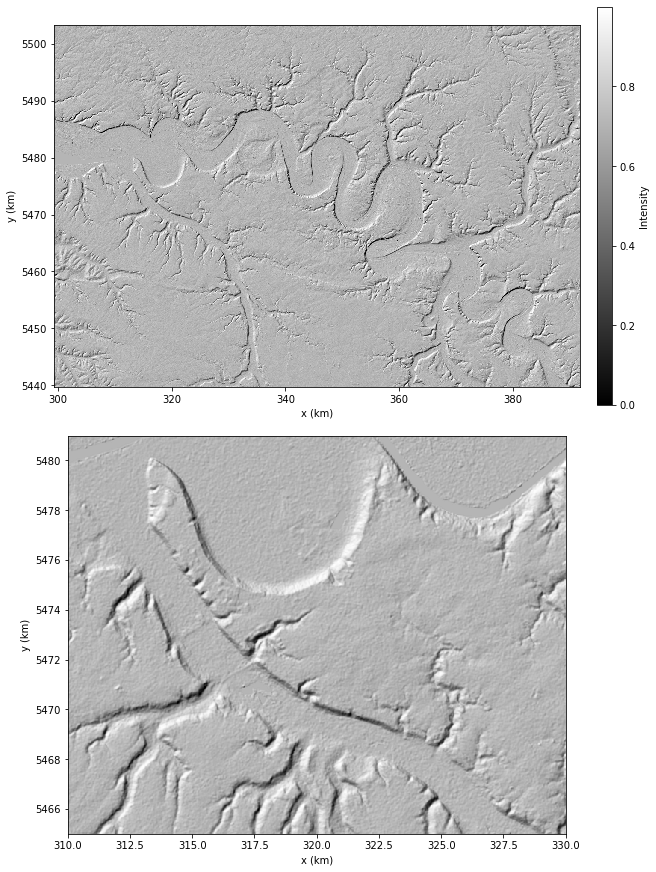

In [24]:
figure, subplots = plt.subplots(nrows=2, figsize=(9, 12), constrained_layout=True)

image = subplots[0].imshow(instensity, cmap=cm.gray, extent=extent/1000.)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')
plt.colorbar(image, ax=subplots[0], label='Intensity')

subplots[1].imshow(instensity, cmap=cm.gray, extent=extent/1000.)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()

Its principle is simple, but its results aren't so great, especially at large scale. Many techniques have been develop to overcome this aspect, let's have a look at two of them. The first one is the [multidirectional, oblique-weighted (MDOW) hillshading](https://pubs.usgs.gov/of/1992/of92-422/of92-422.pdf), which combines several hillshades from several azimuths.

In [25]:
instensity_mdow = psd.hillshading.hillshade_mdow(elevation,
                                                 dst_transform,
                                                 dst_crs,
                                                 radius=1000,
                                                 generalize_spacing=1000,
                                                 azimuths=None,
                                                 altitude=45,
                                                 vert_exag=2)

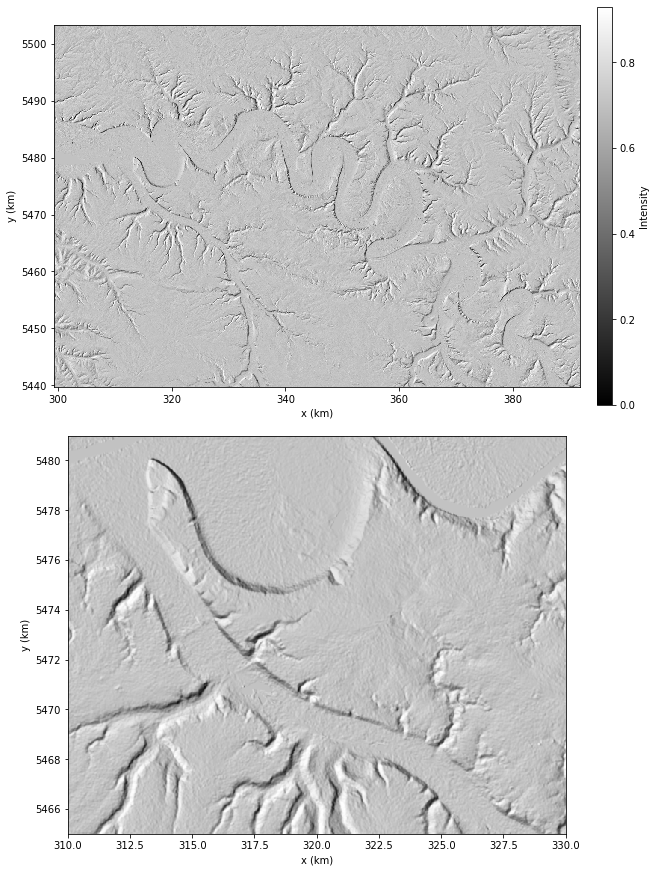

In [26]:
figure, subplots = plt.subplots(nrows=2, figsize=(9, 12), constrained_layout=True)

image = subplots[0].imshow(instensity_mdow, cmap=cm.gray, extent=extent/1000.)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')
plt.colorbar(image, ax=subplots[0], label='Intensity')

subplots[1].imshow(instensity_mdow, cmap=cm.gray, extent=extent/1000.)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()

A more complex method is the [Terrain Sculptor](https://doi.org/10.14714/CP67.114), which generalizes the elevation first to eliminate unnecessary details and emphasize the ridges and valleys. To do so, it uses various combinations of filtering and curvature measurements.

In [27]:
instensity_ts = psd.hillshading.hillshade_terrain_sculptor(elevation,
                                                           spacing=dst_resolution,
                                                           azimuth=315,
                                                           altitude=45,
                                                           vert_exag=2)

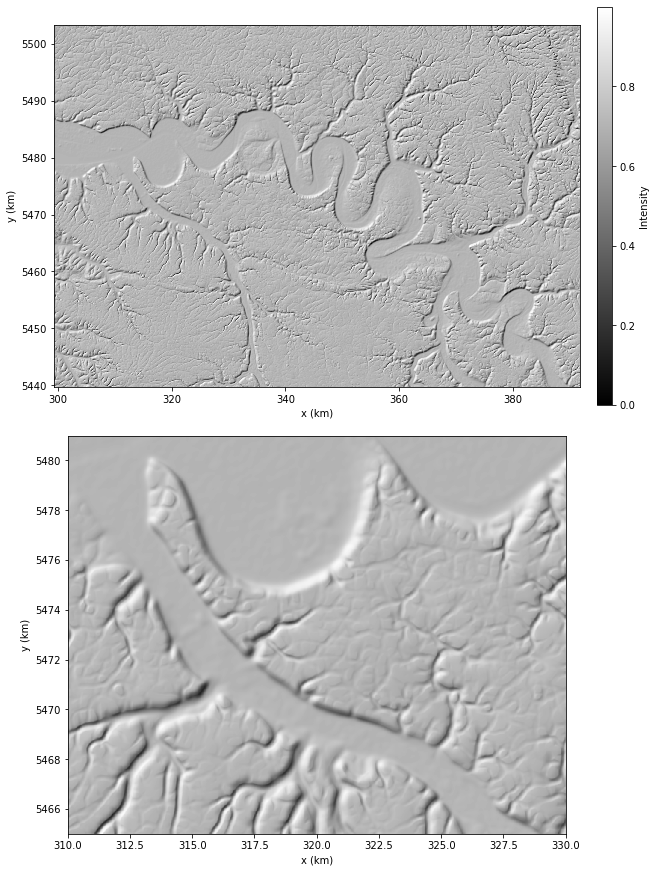

In [28]:
figure, subplots = plt.subplots(nrows=2, figsize=(9, 12), constrained_layout=True)

image = subplots[0].imshow(instensity_ts, cmap=cm.gray, extent=extent/1000.)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')
plt.colorbar(image, ax=subplots[0], label='Intensity')

subplots[1].imshow(instensity_ts, cmap=cm.gray, extent=extent/1000.)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()

Several post-processing methods also exist to improve the hillshade. For instance, flat areas often end up gray, but in reality they are mostly illuminated, and [brightening](http://portal.survey.ntua.gr/main/courses/geoinfo/admcarto/lecture_notes/hill_shading/bibliography/jenny_2001.pdf) them gives a nicer look to the hillshade.

In [29]:
instensity_bts = ndi.median_filter(instensity_ts, size=11)
instensity_bts = psd.hillshading.brighten_flat_areas(instensity_bts,
                                                     elevation,
                                                     spacing=dst_resolution,
                                                     flat_tone=0.9,
                                                     slope_threshold=2,
                                                     curvature=0.8)

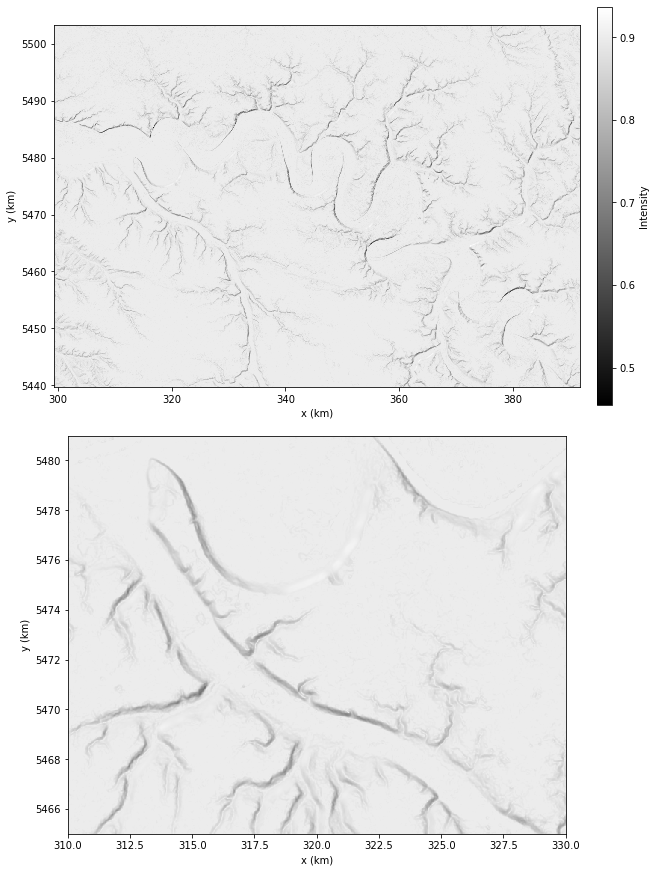

In [30]:
figure, subplots = plt.subplots(nrows=2, figsize=(9, 12), constrained_layout=True)

image = subplots[0].imshow(instensity_bts, cmap=cm.gray, extent=extent/1000.)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')
plt.colorbar(image, ax=subplots[0], label='Intensity')

subplots[1].imshow(instensity_bts, cmap=cm.gray, extent=extent/1000.)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()

Similarly, [atmospheric perspective](https://www.tandfonline.com/doi/abs/10.1559/152304074784107818) gives more pleasing results by obscuring and decreasing the contrast of the lowest areas.

In [31]:
instensity_ats = psd.hillshading.add_atmospheric_perspective(instensity_bts,
                                                             elevation,
                                                             C1=1.05,
                                                             C2=0.05,
                                                             altitude=45)

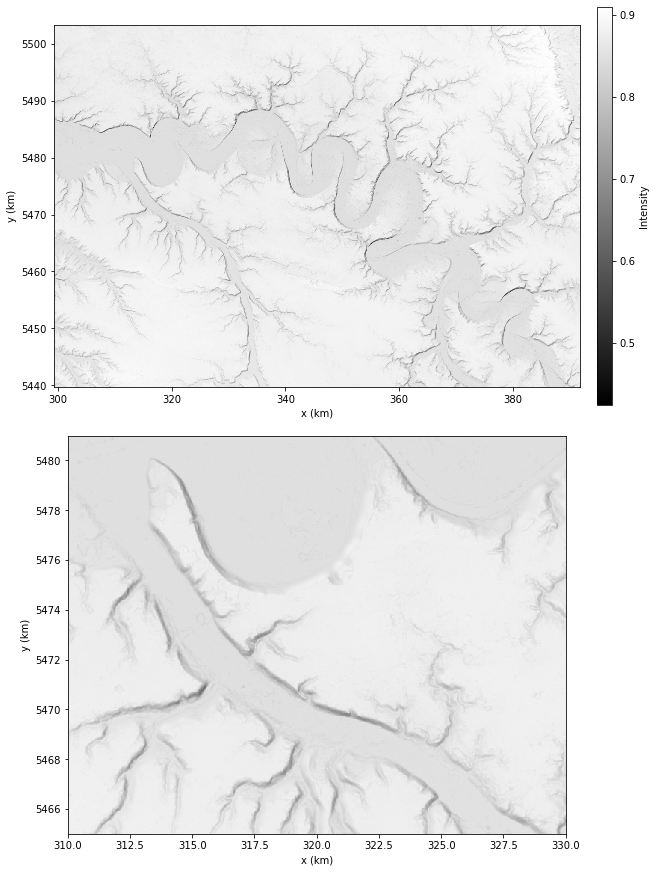

In [32]:
figure, subplots = plt.subplots(nrows=2, figsize=(9, 12), constrained_layout=True)

image = subplots[0].imshow(instensity_ats, cmap=cm.gray, extent=extent/1000.)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')
plt.colorbar(image, ax=subplots[0], label='Intensity')

subplots[1].imshow(instensity_ats, cmap=cm.gray, extent=extent/1000.)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()

# Coloring

A common way of adding back the elevation is to plot it above the hillshade with some transparency.

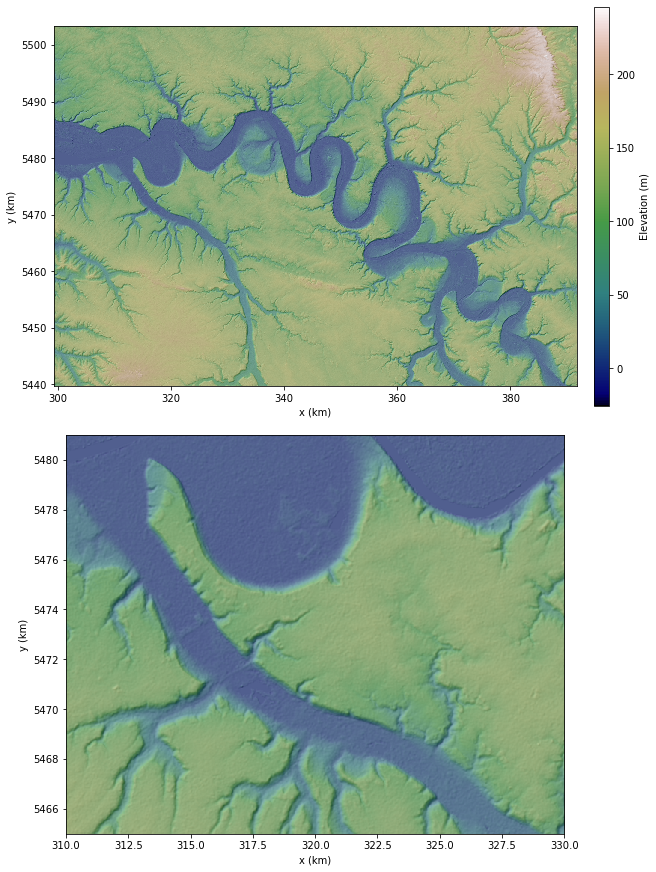

In [33]:
figure, subplots = plt.subplots(nrows=2, figsize=(9, 12), constrained_layout=True)

subplots[0].imshow(instensity, cmap=cm.gray, extent=extent/1000., zorder=0)
subplots[0].imshow(elevation, cmap=cm.gist_earth, alpha=0.6, extent=extent/1000., zorder=1)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')
ax, _ = colorbar.make_axes(subplots[0])
norm = colors.Normalize(vmin=np.min(elevation), vmax=np.max(elevation))
cbar = colorbar.ColorbarBase(ax, cmap=cm.gist_earth, norm=norm, label='Elevation (m)')

subplots[1].imshow(instensity, cmap=cm.gray, extent=extent/1000., zorder=0)
subplots[1].imshow(elevation, cmap=cm.gist_earth, alpha=0.6, extent=extent/1000., zorder=1)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()

But this does not do justice to the relief and the elevation. Blending comes up as a better solution for this. Several techniques exists in [matplotlib](https://matplotlib.org/gallery/specialty_plots/topographic_hillshading.html), pyllshading proposes a different one, the [No Alteration of Grayscale or Intensity (NAGI) fusion method](https://www.esri.com/arcgis-blog/products/product/imagery/combining-colored-and-grayshade-rasters-with-high-fidelity/?rmedium=redirect&rsource=blogs.esri.com/esri/arcgis/2012/01/18/combining-colored-and-grayshade-rasters-with-high-fidelity).

In [34]:
norm = colors.Normalize()
elevation_colored = cm.gist_earth(norm(elevation))
elevation_blended = psd.blending.blend_nagi(elevation_colored,
                                            instensity_ts,
                                            gamma=1.25,
                                            in_range=(10/255, 220/255))

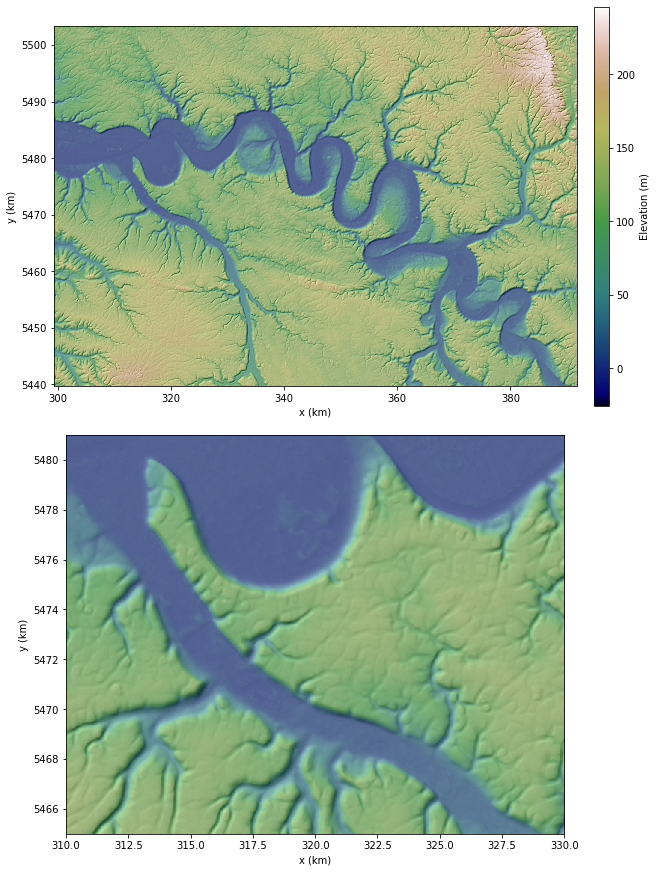

In [35]:
figure, subplots = plt.subplots(nrows=2, figsize=(9, 12), constrained_layout=True)

subplots[0].imshow(elevation_blended, cmap=cm.gist_earth, extent=extent/1000.)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')
ax, _ = colorbar.make_axes(subplots[0])
norm = colors.Normalize(vmin=np.min(elevation), vmax=np.max(elevation))
cbar = colorbar.ColorbarBase(ax, cmap=cm.gist_earth, norm=norm, label='Elevation (m)')

subplots[1].imshow(elevation_blended, cmap=cm.gist_earth, extent=extent/1000.)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()

A [different approach](https://cartographicperspectives.org/index.php/journal/article/view/cp42-barnes) attempts to reproduce the style of the Swiss cartographer Eduard Imhof.

In [36]:
elevation_swiss = psd.hillshading.hillshade_swiss_style(elevation,
                                                        dst_transform,
                                                        dst_crs,
                                                        azimuth=315,
                                                        altitude=45,
                                                        vert_exag=3,
                                                        cmap_aerial=cm.gray,
                                                        cmap_smooth=psd.cmap.blue_yellow,
                                                        alpha_smooth=0.35,
                                                        cmap_dem=cm.gist_earth,
                                                        alpha_dem=0.55)

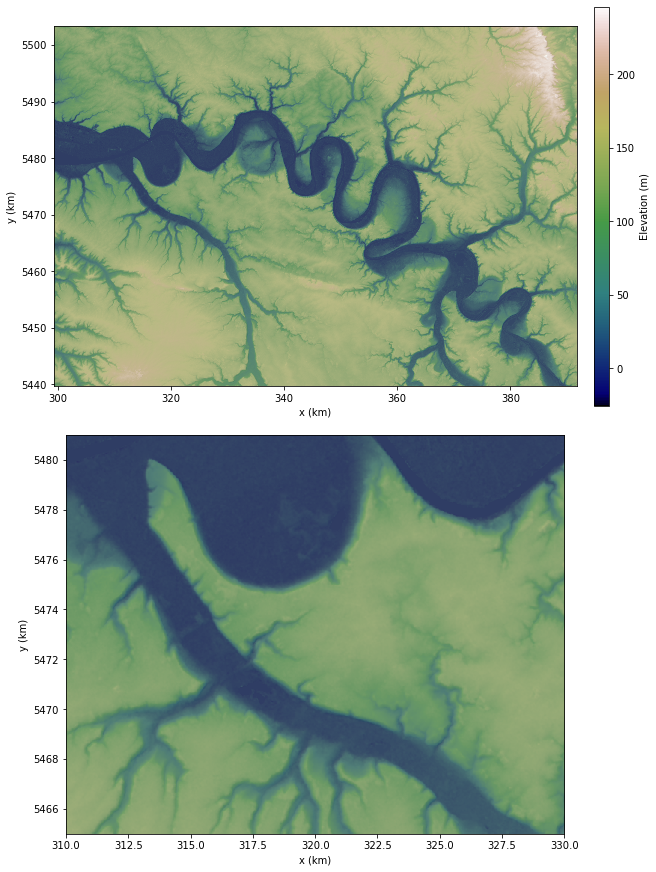

In [37]:
figure, subplots = plt.subplots(nrows=2, figsize=(9, 12), constrained_layout=True)

subplots[0].imshow(elevation_swiss, cmap=cm.gist_earth, extent=extent/1000.)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')
ax, _ = colorbar.make_axes(subplots[0])
norm = colors.Normalize(vmin=np.min(elevation), vmax=np.max(elevation))
cbar = colorbar.ColorbarBase(ax, cmap=cm.gist_earth, norm=norm, label='Elevation (m)')

subplots[1].imshow(elevation_swiss, cmap=cm.gist_earth, extent=extent/1000.)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()

# Other hillshading techniques

This last section shows a more artistic approach to hillshading based on this [ArcGIS Blog post](https://www.esri.com/arcgis-blog/products/living-atlas/mapping/throwing-shade/).

In [38]:
def create_cmap(color, full_transparency):
    
    return colors.LinearSegmentedColormap('custom_cmap',
                                          {'red': [(0., color[0], color[0]),
                                                   (full_transparency, color[0], color[0]),
                                                   (1., color[0], color[0])],
                                           'green': [(0., color[1], color[1]),
                                                     (full_transparency, color[1], color[1]),
                                                     (1., color[1], color[1])],
                                           'blue': [(0.0, color[2], color[2]),
                                                    (full_transparency, color[2], color[2]),
                                                    (1., color[2], color[2])],
                                           'alpha': [(0., 1., 1.),
                                                     (full_transparency, 0., 0.),
                                                     (1., 0., 0.)]})

In [39]:
color = colors.to_rgb('#23008C')
full_transparency = 0.85
cmap = create_cmap(color, full_transparency)
hillshade_1 = psd.hillshading.hillshade_horn(elevation,
                                             spacing=dst_resolution,
                                             azimuth=315,
                                             altitude=45,
                                             vert_exag=3)
hillshade_1 = cmap(hillshade_1)

In [40]:
color = colors.to_rgb('#0059B2')
full_transparency = 0.85
cmap = create_cmap(color, full_transparency)
hillshade_2 = psd.hillshading.hillshade_horn(elevation,
                                             spacing=dst_resolution,
                                             azimuth=360,
                                             altitude=45,
                                             vert_exag=3)
hillshade_2 = cmap(hillshade_2)

In [41]:
color = (102/255., 0., 102/255.)
full_transparency = 0.85
cmap = create_cmap(color, full_transparency)
hillshade_3 = psd.hillshading.hillshade_horn(elevation,
                                             spacing=dst_resolution,
                                             azimuth=270,
                                             altitude=45,
                                             vert_exag=3)
hillshade_3 = cmap(hillshade_3)

In [42]:
color = colors.to_rgb('#FFF5D7')
full_transparency = 0.5
cmap = create_cmap(color, full_transparency)
norm = colors.Normalize()
atmospheric_perspective = cmap(norm(elevation))

In [43]:
composite = psd.blending.composite_alpha(hillshade_2, hillshade_3)
composite = psd.blending.composite_alpha(hillshade_1, composite)
composite = psd.blending.composite_alpha(atmospheric_perspective, composite)

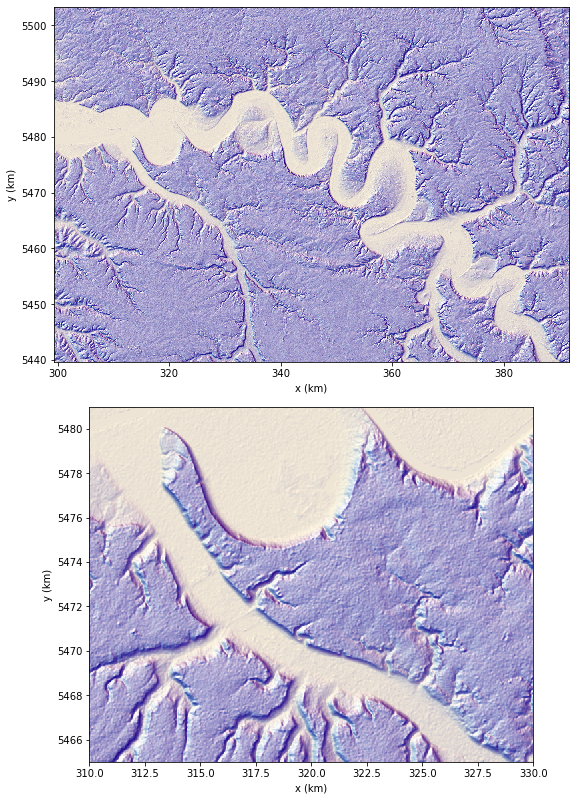

In [44]:
figure, subplots = plt.subplots(nrows=2, figsize=(8, 11), constrained_layout=True)

subplots[0].imshow(composite, extent=extent/1000.)
subplots[0].set_xlabel('x (km)')
subplots[0].set_ylabel('y (km)')

subplots[1].imshow(composite, extent=extent/1000.)
subplots[1].set_xlabel('x (km)')
subplots[1].set_ylabel('y (km)')
subplots[1].set_xlim(310, 330)
subplots[1].set_ylim(5465, 5481)

plt.show()